# Neural Zoo

In [27]:
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from functions import unpickle, filtre, info, display_img, make_autopct

import tensorflow as tf
from tensorflow import keras

# first neural network with keras tutorial
from numpy import loadtxt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense


from sklearn.model_selection import train_test_split


## Dataset import

In [2]:
batch_1 = unpickle('cifar-10-batches-py\data_batch_1')
batch_2 = unpickle('cifar-10-batches-py\data_batch_2')
batch_3 = unpickle('cifar-10-batches-py\data_batch_3')
batch_4 = unpickle('cifar-10-batches-py\data_batch_4')
batch_5 = unpickle('cifar-10-batches-py\data_batch_5')

meta = unpickle('cifar-10-batches-py\\batches.meta')

test_batch = unpickle('cifar-10-batches-py\\test_batch')

In [3]:
dataset = {
    b'batch_label': b'full training dataset',
    b'labels': batch_1[b'labels'] + batch_2[b'labels'] + batch_3[b'labels'] + batch_4[b'labels'] + batch_5[b'labels'],
    b'data': np.asarray(batch_1[b'data'].tolist() + batch_2[b'data'].tolist() + batch_3[b'data'].tolist() + batch_4[b'data'].tolist() + batch_5[b'data'].tolist(), dtype=np.uint8),
    b'filenames': batch_1[b'filenames'] + batch_2[b'filenames'] + batch_3[b'filenames'] + batch_4[b'filenames'] + batch_5[b'filenames']}

## Animal filter

In [4]:
animals = [2, 3, 4, 5, 6, 7]

In [5]:
info(dataset)

dataset label : b'full training dataset'
labels len : 50000
data len : 50000
filenames len : 50000


In [6]:
dataset = filtre(dataset, animals)

In [7]:
info(dataset)

dataset label : b'full filtered training dataset'
labels len : 30000
data len : 30000
filenames len : 30000


## Sample display

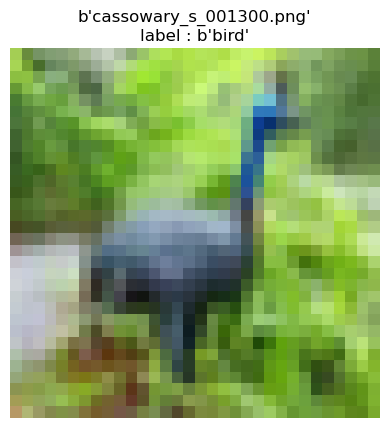

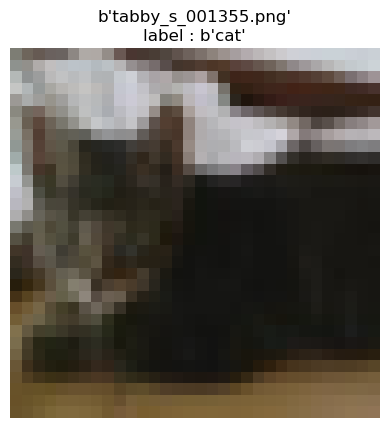

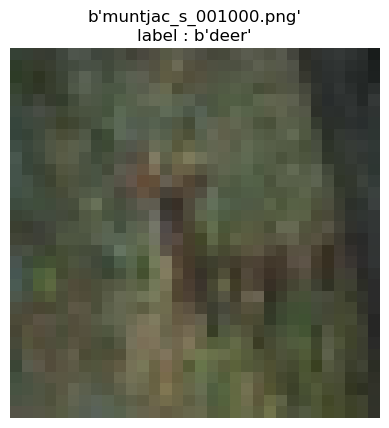

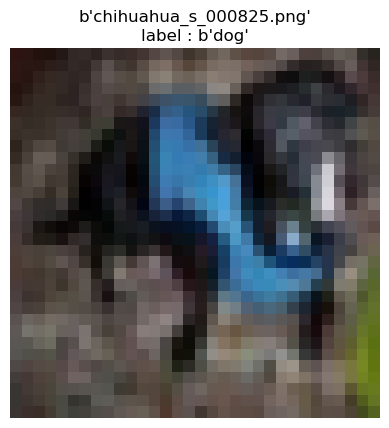

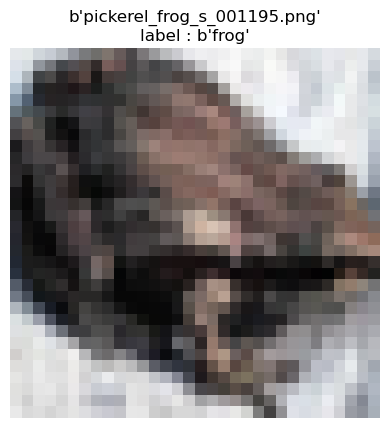

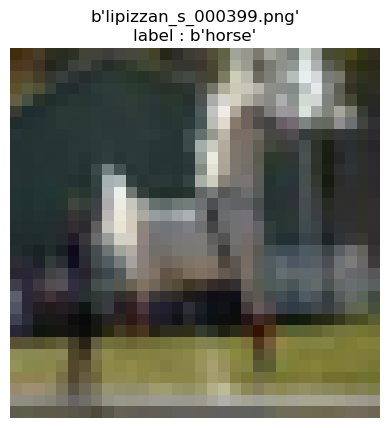

In [8]:
j = 0
i = 0

while (i < 30000 and j < 6):
    if dataset[b'labels'][i] == animals[j]:
        plt.show()
        display_img(dataset, meta, i)

        j = j + 1

    i = i + 1

## Data Exploration

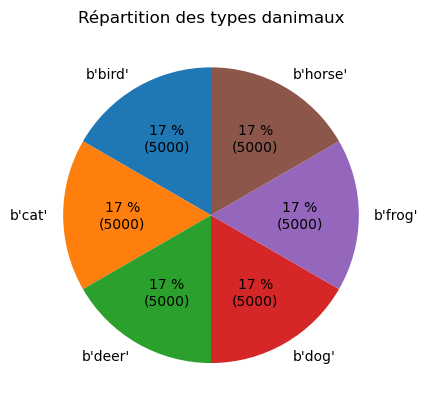

In [9]:
plt.pie(pd.value_counts(dataset[b'labels']), labels = meta[b'label_names'][2:8], autopct=make_autopct(pd.value_counts(dataset[b'labels'])), startangle = 90)

plt.title('Répartition des types d''animaux')

plt.show()

## MLP

In [10]:
#define input and output variables

X = dataset[b'data']
y = dataset[b'labels']

In [11]:
X

[[59,
  43,
  50,
  68,
  98,
  119,
  139,
  145,
  149,
  149,
  131,
  125,
  142,
  144,
  137,
  129,
  137,
  134,
  124,
  139,
  139,
  133,
  136,
  139,
  152,
  163,
  168,
  159,
  158,
  158,
  152,
  148,
  16,
  0,
  18,
  51,
  88,
  120,
  128,
  127,
  126,
  116,
  106,
  101,
  105,
  113,
  109,
  112,
  119,
  109,
  105,
  125,
  127,
  122,
  131,
  124,
  121,
  131,
  132,
  133,
  133,
  123,
  119,
  122,
  25,
  16,
  49,
  83,
  110,
  129,
  130,
  121,
  113,
  112,
  112,
  106,
  105,
  128,
  124,
  130,
  127,
  122,
  115,
  120,
  130,
  131,
  139,
  127,
  126,
  127,
  130,
  142,
  130,
  118,
  120,
  109,
  33,
  38,
  87,
  106,
  115,
  117,
  114,
  105,
  107,
  121,
  125,
  109,
  113,
  146,
  133,
  127,
  118,
  117,
  127,
  122,
  132,
  137,
  136,
  131,
  124,
  130,
  132,
  135,
  130,
  125,
  121,
  94,
  50,
  59,
  102,
  127,
  124,
  121,
  120,
  114,
  107,
  125,
  129,
  106,
  108,
  124,
  121,
  108,
  98,
  110,


In [12]:
X = np.asarray(X)

In [13]:
X

array([[ 59,  43,  50, ..., 140,  84,  72],
       [ 28,  37,  38, ...,  28,  37,  46],
       [164, 105, 118, ...,  29,  26,  44],
       ...,
       [188, 186, 187, ..., 186, 171, 170],
       [145, 151, 156, ...,  56,  53,  54],
       [255, 254, 255, ...,  79,  81,  76]])

In [14]:
y = tf.one_hot(y, 6)

In [15]:
y

<tf.Tensor: shape=(30000, 6), dtype=float32, numpy=
array([[0., 0., 0., 0., 0., 0.],
       [0., 0., 0., 0., 1., 0.],
       [0., 0., 1., 0., 0., 0.],
       ...,
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 1., 0., 0., 0.],
       [0., 0., 0., 0., 0., 0.]], dtype=float32)>

In [16]:
#define the keras model

model = Sequential()
model.add(Dense(1024, input_shape=(3072,), activation='relu'))
model.add(Dense(512, activation='relu'))
model.add(Dense(128, activation='relu'))
model.add(Dense(32, activation='relu'))
model.add(Dense(6, activation='softmax'))


In [17]:
# compile the keras model

model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [18]:
# fit the keras model on the dataset

model.fit(X, y, epochs=5, batch_size=10)


Epoch 1/5
3000/3000 [==============================] - 249s 83ms/step - loss: 82044878848.0000 - accuracy: 0.1673
Epoch 2/5
3000/3000 [==============================] - 245s 82ms/step - loss: 1457462312960.0000 - accuracy: 0.1643
Epoch 3/5
3000/3000 [==============================] - 244s 81ms/step - loss: 6164326645760.0000 - accuracy: 0.1628
Epoch 4/5
3000/3000 [==============================] - 246s 82ms/step - loss: 15099295170560.0000 - accuracy: 0.1660
Epoch 5/5
3000/3000 [==============================] - 252s 84ms/step - loss: 33502517002240.0000 - accuracy: 0.1682


In [19]:
# evaluate the keras model

_, accuracy = model.evaluate(X, y)
print('Accuracy: %.2f' % (accuracy*100))


938/938 [==============================] - 8s 8ms/step - loss: 37226574512128.0000 - accuracy: 0.1667
Accuracy: 16.67


Model 2


In [39]:
type(X)

numpy.ndarray

In [45]:
X

array([[ 59,  43,  50, ..., 140,  84,  72],
       [ 28,  37,  38, ...,  28,  37,  46],
       [164, 105, 118, ...,  29,  26,  44],
       ...,
       [188, 186, 187, ..., 186, 171, 170],
       [145, 151, 156, ...,  56,  53,  54],
       [255, 254, 255, ...,  79,  81,  76]])

In [40]:
type(y)

tensorflow.python.framework.ops.EagerTensor

In [41]:
import tensorflow.keras.backend as K
b = K.constant(X)
type(b)

tensorflow.python.framework.ops.EagerTensor

In [46]:
b

<tf.Tensor: shape=(30000, 3072), dtype=float32, numpy=
array([[ 59.,  43.,  50., ..., 140.,  84.,  72.],
       [ 28.,  37.,  38., ...,  28.,  37.,  46.],
       [164., 105., 118., ...,  29.,  26.,  44.],
       ...,
       [188., 186., 187., ..., 186., 171., 170.],
       [145., 151., 156., ...,  56.,  53.,  54.],
       [255., 254., 255., ...,  79.,  81.,  76.]], dtype=float32)>

In [48]:
y_2 = np.asarray(y)

In [55]:
X_train, X_test, y_train, y_test = train_test_split(X, y_2, test_size=0.2, stratify=y_2)

In [56]:
#define the keras model

model_2 = Sequential()
model_2.add(Dense(1024, input_shape=(3072,), activation='relu'))
model_2.add(Dense(512, activation='relu'))
model_2.add(Dense(128, activation='relu'))
model_2.add(Dense(32, activation='relu'))
model_2.add(Dense(6, activation='softmax'))


In [57]:
# compile the keras model

model_2.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])


In [59]:
# fit the keras model on the dataset

model_2.fit(X_train, y_train, epochs=5, batch_size=32, validation_data=(X_test, y_test))


Epoch 1/5
750/750 [==============================] - 65s 86ms/step - loss: 894970363904.0000 - accuracy: 0.1695 - val_loss: 1501638557696.0000 - val_accuracy: 0.1667
Epoch 2/5
750/750 [==============================] - 65s 87ms/step - loss: 1641016066048.0000 - accuracy: 0.1660 - val_loss: 2581868838912.0000 - val_accuracy: 0.1667
Epoch 3/5
750/750 [==============================] - 69s 92ms/step - loss: 2545038655488.0000 - accuracy: 0.1657 - val_loss: 2434243493888.0000 - val_accuracy: 0.1667
Epoch 4/5
750/750 [==============================] - 83s 110ms/step - loss: 3208693940224.0000 - accuracy: 0.1653 - val_loss: 6460933144576.0000 - val_accuracy: 0.1667
Epoch 5/5
750/750 [==============================] - 82s 109ms/step - loss: 4551932903424.0000 - accuracy: 0.1660 - val_loss: 7350699163648.0000 - val_accuracy: 0.1667


In [ ]:
# evaluate the keras model

_, accuracy = model_2.evaluate(X, y)
print('Accuracy: %.2f' % (accuracy*100))
